<font size="7"><center>Password Strength Classifier Using Machine Learning</center></font>
---

<div class="alert alert-warning">
    
<font size="2">__Author__: -  Kasun Malwenna</font>

<font size="2">__Contact__: - kasunmalwenna@gmail.com</font>
</div>

<div class="alert alert-success">
    
<font size="5"><center>**Objective**</center></font>
    
<font size="3">This project focuses on building a password strength classification model with high accuracy using Machine Learning. The model will output the strength of a password on a scale from 0 (lowest strength) to 2 (highest strength).</font>
</div>

---
# 1. Introduction

Password strength measures how well a password can withstand being guessed or hacked. External attacks can come in the form of password cracking or brute-force attacks, which aim to gain unauthorized access to a computer system or network. 

The strength of a password is typically measured by its complexity, length, and unpredictability. Unfortunately, cybercrimes and data breaches have been increasing, and a big reason for this is that passwords are often compromised and weak.

In this notebook, I will explore how Machine Learning can be employed to classify the strength of a password.

---
# 2. Dataset

The dataset is downloadabale for free from [Kaggle](https://www.kaggle.com/datasets/bhavikbb/password-strength-classifier-dataset), and contains passwords from the 000webhost leak that is available online. The dataset has been pre-classified by Georgia Tech University's PARS tool, which rates passwords as weak, medium, or strong. There are 700k records in the dataset.

lets look at the Data Dictionary


| Variable name      | Description                                    |
|----------------   -|------------------------------------------------|
| password           | The date of the flight                         |
| strength           | ordinally encoded pasword strength             |


### Importing Libraries

First, we will import the necessary libraries and packages for the analysis.

In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# upsample the credit card example
from sklearn.utils import resample

import plotly
import plotly.express as px
import plotly.io as pio
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)

import imblearn
from imblearn.under_sampling import RandomUnderSampler

from collections import Counter

import random

from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Importing metrics to evaluate performance
from sklearn.metrics import plot_confusion_matrix, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

#Importing required module to create temporary files 
from tempfile import mkdtemp

# Importing required library to save and load models
import joblib

### Importing Datset

In [2]:
# Import data to dataframe
data=pd.read_csv('data/data.csv',error_bad_lines=False)

# Inspect economy set
data.head()

Skipping line 2810: expected 2 fields, saw 5
Skipping line 4641: expected 2 fields, saw 5
Skipping line 7171: expected 2 fields, saw 5
Skipping line 11220: expected 2 fields, saw 5
Skipping line 13809: expected 2 fields, saw 5
Skipping line 14132: expected 2 fields, saw 5
Skipping line 14293: expected 2 fields, saw 5
Skipping line 14865: expected 2 fields, saw 5
Skipping line 17419: expected 2 fields, saw 5
Skipping line 22801: expected 2 fields, saw 5
Skipping line 25001: expected 2 fields, saw 5
Skipping line 26603: expected 2 fields, saw 5
Skipping line 26742: expected 2 fields, saw 5
Skipping line 29702: expected 2 fields, saw 5
Skipping line 32767: expected 2 fields, saw 5
Skipping line 32878: expected 2 fields, saw 5
Skipping line 35643: expected 2 fields, saw 5
Skipping line 36550: expected 2 fields, saw 5
Skipping line 38732: expected 2 fields, saw 5
Skipping line 40567: expected 2 fields, saw 5
Skipping line 40576: expected 2 fields, saw 5
Skipping line 41864: expected 2 field

,password,strength
0,kzde5577,1
1,kino3434,1
2,visi7k1yr,1
3,megzy123,1
4,lamborghin1,1


We have added the error_bad_lines=False command so that pandas will only read complete data samples from the datasets. By adding this command, our dataset will be loaded without errors.

Lets look at the shape of the dataset and inspects the datatypes.

In [3]:
# Dataset summary
print(f"Rows in the dataframe: {data.shape[0]}")
print(f"Columns in the dataframe: {data.shape[1]}")

Rows in the dataframe: 669640
Columns in the dataframe: 2


In [4]:
# Observe the data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 669640 entries, 0 to 669639
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   password  669639 non-null  object
 1   strength  669640 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 10.2+ MB


To get a better idea on what we are classifying, lets check the unique levels of our target column.

In [5]:
# Check unique values in target feature
data['strength'].unique()

array([1, 2, 0], dtype=int64)

Our password strength has three values: 0 for the weakest passwords, 1 for medium passwords, and 2 for the strongest passwords.

---
# 3. Data Cleaning

### Missing Values

Missing values make the dataset incomplete and this gives inaccurate results. 

In [6]:
# Check for  missing values
data.isna().sum()

password    1
strength    0
dtype: int64

We have a single missing value for password column. lets visualize it in the dataframe.

In [7]:
# Looking at the coulmn with missing observation
data[data['password'].isnull()]

,password,strength
367579,NaN,0


It is obvious that we cannot predict the strength of a password without having a password. Therefor we can directly drop this observation.

In [8]:
# Drop missing values
data.dropna(inplace=True)

#check
data.isnull().sum()

password    0
strength    0
dtype: int64

### Duplicate Values

Duplicates can also skew the analysis. Let’s see if any are present.

In [9]:
# check for duplicate rows
data.duplicated().sum()

0

--- 
# 4. Data Preprocessing

Now that the dataset is clean, lets look at the distribution of the targer column.

In [10]:
# Visalize targer column distribution
fig = px.histogram(data, x="strength", color="strength")
fig.update_xaxes(type='category')
fig.update_xaxes(categoryorder='array', categoryarray= ['0', '1', '2'])
fig.show()

We observe a huge imbalance in the dataset which in not good as our model will now be biased towards the majority class.

### Dealing with Class Imbalance

We can either upsample the minority classes or downsample the majority classes to have an even and fair distribution.
One can argue that downsampling is not the best option as it will remove information from the dataset. However, I will downsample the majority class as that will leave me with fewer but considerably enough observations for our analysis.

Firt lest define our dependent and independent variables.

In [11]:
# Defining the dependent and independent variables 
X = data.drop(columns=['strength'])
y = data['strength']

We can use the `imblearn` package to downsample the data.

In [12]:
# define undersample strategy
undersample = RandomUnderSampler(sampling_strategy='majority')

# fit and apply the transform
X_over, y_over = undersample.fit_resample(X, y)

# summarize new class distribution
print(Counter(y_over))

Counter({0: 89701, 1: 83137, 2: 83137})


In [13]:
# Inspect
X_over.head()

,password
0,intel1
1,lsdlsd1
2,olmaz.
3,ok>bdk
4,d04m11


In [14]:
# Inspect
y_over.head()

0    0
1    0
2    0
3    0
4    0
Name: strength, dtype: int64

Let’s create a new dataframe from the downsampled data to work with.

In [15]:
# Create new dataframe with downsampled data
df=pd.concat([X_over,y_over],axis=1)

# Inspect
df.head()

,password,strength
0,intel1,0
1,lsdlsd1,0
2,olmaz.,0
3,ok>bdk,0
4,d04m11,0


In [16]:
# new Dataframe summary
print(f"Rows in the balanced dataframe: {df.shape[0]}")
print(f"Columns in the balanced dataframe: {df.shape[1]}")

Rows in the balanced dataframe: 255975
Columns in the balanced dataframe: 2


In [17]:
df['strength'].value_counts()

0    89701
1    83137
2    83137
Name: strength, dtype: int64

Let’s visualize the new target distribution.

In [18]:
fig = px.histogram(df, x="strength", color="strength")
fig.update_xaxes(type='category')
fig.update_xaxes(categoryorder='array', categoryarray= ['0', '1', '2'])
fig.show()

We certainly have a balanced class distribution without bias.

### Convert dataset into an array

An array is much easier to work with. We will therefore use the `NumPy` Python library to convert the dataframe to an array.

In [19]:
# Convert to array
password_tuple=np.array(df)

# Check
password_tuple

array([['intel1', 0],
       ['lsdlsd1', 0],
       ['olmaz.', 0],
       ...,
       ['weslley.06888524', 2],
       ['sakaryal&#305;', 2],
       ['8rp4PTTM1MAlcLw0', 2]], dtype=object)

### Difine independent and Dependent variables

In machine learning, the features are the unique independent variables in the dataset that are used as input for the model. I
The labels in our dataset correspond to the output values of our models. n this case, the features are located in the `password` column and the labels can be found in the `strength` column.

As we have already converted the dataset into an array, we have to use a for loop to iterate over each list in the array to define dependent and independent variables.

In [20]:
# For loop to iterate over the array
X=[lists[0] for lists in password_tuple]
y=[lists[1] for lists in password_tuple]


In [21]:
# Check
print(len(X))
X

255975


['intel1',
 'lsdlsd1',
 'olmaz.',
 'ok>bdk',
 'd04m11',
 'sknq7m0',
 'kjkjkj1',
 'bgrvl80',
 'gdfn76',
 'p2share',
 'gill02',
 'j09000',
 'woon12',
 'xiau5ff',
 'mmm23mm',
 'gkrqjs6',
 'yu4cmn',
 'ass359',
 'icap12',
 '2akira2',
 'moken7',
 'z3ro1sm',
 'g3rappa',
 'sanki1',
 '5gzj5uf',
 'kinga22',
 'barra23',
 '2fakjv',
 'teste10',
 'demon10',
 '4osxw4r',
 'nello11',
 'sasuke4',
 'z888888',
 'marita1',
 'v10rica',
 'gozv3e5',
 'q0pv0fk',
 'mike09',
 'gtlek',
 'uou2dae',
 'patty94',
 'kry1z9',
 'kuntz80',
 '6yy6yy',
 'y0unus',
 'josue12',
 'juany57',
 'autan88',
 'yy4129',
 'clave08',
 'hasan18',
 'sebo82',
 'IRZA98',
 'oioo9og',
 'aio42fv',
 'bang6k',
 'oscar69',
 'seller1',
 'jbtcnd6',
 'byeypb2',
 'sono11',
 'junaid5',
 'killer5',
 'viri13',
 'yami12',
 'legna13',
 'qwekl12',
 'urban1',
 'woaini0',
 'mussuh4',
 '05bumd',
 'kevin24',
 'hola45',
 'diarie1',
 'matha81',
 'mark11',
 'jcav26',
 'carla99',
 'm4r4hne',
 'skoda06',
 'taccy12',
 'ykfums1',
 'iubat09',
 'faqih82',
 'jannia5',


In [22]:
# Cehck
print(len(y))
y

255975


[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [23]:
y.count(2)

83137

### Tokenization

The process of tokenization simply involves breaking down text data into simpler characters, called tokens. We'll break our password text down into word tokens, which we'll then use as input for our model. This wil introduce considerably high dimensionality to our model.

We can create a custom function to split the password text to characters.

In [24]:
# Define a fuction to tokenize input
def create_tokens(inputs):
    """
     Takes in a string and returns a list of 
     characters present in the string.
    """
    
    character=[]
    for i in inputs:
        character.append(i)
    return character

In [25]:
# Check the function with a custome password
create_tokens('sknq7m0')

['s', 'k', 'n', 'q', '7', 'm', '0']

### Vectorization of Tokens

We need to convert the word tokens into numeric data so that the machine learning models can understant them. The `TfidfVectorizer` package will do this by creating vectors of numbers based on the frequency of occurrence of each word token.

#### import TF-IDF vectorizer to convert String data into numerical data

In [26]:
# Convert String data into numerical data

# Instansiate vectorizer
vectorizer=TfidfVectorizer(tokenizer = create_tokens)

# Fit and transform 
X=vectorizer.fit_transform(X)

Let’s check the shape of the independent variables now after tokenization and vectorization.

In [27]:
# Check shape
X.shape

(255975, 144)

In [28]:
# Look at variable names
vectorizer.get_feature_names()

['\x02',
 '\x04',
 '\x05',
 '\x06',
 '\x08',
 '\x0e',
 '\x0f',
 '\x10',
 '\x11',
 '\x12',
 '\x13',
 '\x16',
 '\x17',
 '\x18',
 '\x19',
 '\x1b',
 '\x1c',
 '\x1d',
 '\x1e',
 ' ',
 '!',
 '"',
 '#',
 '$',
 '%',
 '&',
 '(',
 ')',
 '*',
 '+',
 '-',
 '.',
 '/',
 '0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 'a',
 'b',
 'c',
 'd',
 'e',
 'f',
 'g',
 'h',
 'i',
 'j',
 'k',
 'l',
 'm',
 'n',
 'o',
 'p',
 'q',
 'r',
 's',
 't',
 'u',
 'v',
 'w',
 'x',
 'y',
 'z',
 '{',
 '|',
 '}',
 '~',
 '\x7f',
 '\x81',
 '\x8d',
 '\xa0',
 '¡',
 '¢',
 '¤',
 '¦',
 '§',
 '«',
 '°',
 '±',
 '²',
 '³',
 '´',
 'µ',
 '¶',
 '·',
 '¹',
 'º',
 '¼',
 '½',
 '¾',
 '¿',
 '×',
 'ß',
 'à',
 'á',
 'â',
 'ã',
 'ä',
 'å',
 'æ',
 'ç',
 'é',
 'ê',
 'í',
 'î',
 'ð',
 'ñ',
 'ò',
 'ó',
 'ô',
 'õ',
 'ö',
 '÷',
 'ù',
 'ú',
 'û',
 'ü',
 'ý',
 'þ',
 'ÿ',
 'œ',
 '—',
 '…',
 '‹',
 '›',
 '™']

Let's inspect the firsty document

In [29]:
first_document_vector=X[0]
first_document_vector

<1x144 sparse matrix of type '<class 'numpy.float64'>'
	with 6 stored elements in Compressed Sparse Row format>

To fetch the data we have to transport the firt document to dense form.

In [30]:
first_document_vector.T.todense()

matrix([[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.36546486],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0

Let's visualize the first document by putting it into a dataframe.

In [31]:
# Create the dataframe
firts_doc_df=pd.DataFrame(first_document_vector.T.todense(),index=vectorizer.get_feature_names(),columns=['TF-IDF'])

# Sort by highest frequency
firts_doc_df.sort_values(by=['TF-IDF'],ascending=False)

,TF-IDF
l,0.462821
t,0.436840
n,0.400508
i,0.394418
e,0.381354
...,...
8,0.000000
7,0.000000
6,0.000000
5,0.000000


---
# 5. Model Building

Let’s first split the data into training and test sets. Our test set will contain 20% of the total data, and the train will contain the rest.

    train---> Will be used to learn the relationship within data, 
    test----> Will be used to make predictions and is unseen by model

In [32]:
# Split the data so the test set contains 20% of the points
# random state is setting the seed for the random split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.2, random_state=123,stratify=y)

# Check shapes 
print(f' Train set shape: {X_train.shape}')
print(f' Test set shape: {X_test.shape}')

 Train set shape: (204780, 144)
 Test set shape: (51195, 144)


## Logistic Regression Model

First Let's fit a logistic regression model to transforemd dataset wilth all default parameters and evaluate the model as it is a good base model to start with. Since this is a multiclass classification problem, we have set the __multi_class__ parameter.

In [33]:
%%time
# Instantiate the model
lgr_model=LogisticRegression(random_state=123, multi_class='multinomial')

# Fit the mdoel
lgr_model.fit(X_train,y_train)

# Scoring on train and test sets
print(f'Accuracy Score on feature reduced train set: {lgr_model.score(X_train, y_train):0.4f}')
print(f'Accuracy Score on feature reduced test set:{lgr_model.score(X_test, y_test):0.4f}')

Accuracy Score on feature reduced train set: 0.8027
Accuracy Score on feature reduced test set:0.8043
CPU times: total: 3.28 s
Wall time: 3.28 s


We have a 80% accuracy from logistic regression and model in not overfitting to training data. Let’s further investigate performance by using a confusion matrix and classification report.

A confusion matrix, also known as an error matrix, is a summarized table used to assess the performance of a classification model. The number of correct and incorrect predictions are summarized with count values and broken down by each class.

Classification report records three important metrics to evaluate the classification models on.
- Precision: Percentage of correct positive predictions relative to total positive predictions.
- Recall: Percentage of correct positive predictions relative to total actual positives.
- F1 Score: A weighted harmonic mean of precision and recall. The closer to 1, the better the model.

In [34]:
# Get class predictions
y_pred_lgr = lgr_model.predict(X_test)

# Generate confusion matrix
cf_matrix_lgr = confusion_matrix(y_test, y_pred_lgr)

# label rows and columns
cf_lgr_df = pd.DataFrame(
    cf_matrix_lgr, 
    columns=["Predicted weak(0)", "Predicted medium(1)", "Predicted strong(2)"],
    index=["True weak(0)", "True medium(1)", "True strong(2)"]
)

display(cf_lgr_df)

,Predicted weak(0),Predicted medium(1),Predicted strong(2)
True weak(0),15224,2679,37
True medium(1),3554,11074,2000
True strong(2),277,1474,14876


              precision    recall  f1-score   support

           0       0.80      0.85      0.82     17940
           1       0.73      0.67      0.70     16628
           2       0.88      0.89      0.89     16627

    accuracy                           0.80     51195
   macro avg       0.80      0.80      0.80     51195
weighted avg       0.80      0.80      0.80     51195



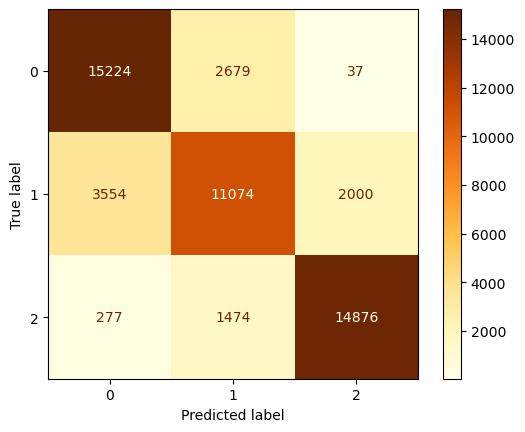

In [35]:
# Display confution metrix
ConfusionMatrixDisplay.from_estimator(lgr_model, X_test, y_test, cmap = 'YlOrBr')

# looking at classificatio report
print(classification_report(y_test, y_pred_lgr))

<div class="alert alert-info">

### Interpreting the model
    
Let’s interpret our logistic regression model using __medium strength class(1)__.
- __Precision__: Out of all the passwords that the model predicted to be medium in strength, only 73% were truly medium in strength.
- __Recall__: Out of all the passwords that were truly medium in strength, the model only predicted 67% correctly as medium in strength.
- __F1 Score__ is 0.7, which isn’t very close to 1. It tells us that the model does a poor job in predicting medium strength class.


## Random Forest Model

Random forest is a tree-based method that performs naturally well on classification problems. Let’s train the model.

In [40]:
%%time
# Instantiate the model
rf_model=RandomForestClassifier(random_state=123)

# Fit the mdoel
rf_model.fit(X_train,y_train)

# Scoring on train and test sets
print(f'Accuracy Score on feature reduced train set: {rf_model.score(X_train, y_train):0.4f}')
print(f'Accuracy Score on feature reduced test set:{rf_model.score(X_test, y_test):0.4f}')

Accuracy Score on feature reduced train set: 0.9998
Accuracy Score on feature reduced test set:0.9510
CPU times: total: 4min 56s
Wall time: 4min 56s


We have 99.9% accuracy on the train set and 95.1% on the test set. Due to the discrepancy of the accuracy scores, we can conclude that the model is overfitting to the train data. This can be addressed by tuning the model’s hyperparameters. Let’s look at the hyperparameter values for the default model first.

In [42]:
# Looking at the hyperparameter values base model used
rf_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

Let’s tune some important hyperparameters using a Grid search cross-validation of 5 folds.

In [53]:
# Rest cache object
cachedir = mkdtemp()

# Create a pipeline with regressor and memory argument
rf_pipe = Pipeline([("rf", RandomForestClassifier(random_state=123))], memory=cachedir)

In [54]:
%%time

# Create the parameter grid based on the results of random search 
param_grid = {
    'rf__max_depth': [None, 10, 20],
    'rf__min_samples_leaf': [1,2,3],
    'rf__n_estimators': [100, 300, 400]
}

# Instantiate the grid search model
rf_grid = GridSearchCV(estimator = rf_pipe, 
                       param_grid = param_grid, 
                       cv = 5, 
                       n_jobs = -1, 
                       verbose = 2)

# Fit the grid search model
rf_grid.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPU times: total: 19min 33s
Wall time: 2h 43min 22s


GridSearchCV(cv=5,
             estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmpjeibhese',
                                steps=[('rf',
                                        RandomForestClassifier(random_state=123))]),
             n_jobs=-1,
             param_grid={'rf__max_depth': [None, 10, 20],
                         'rf__min_samples_leaf': [1, 2, 3],
                         'rf__n_estimators': [100, 300, 400]},
             verbose=2)

In [55]:
# Observe the best combination of parameters
rf_grid.best_params_

{'rf__max_depth': None, 'rf__min_samples_leaf': 1, 'rf__n_estimators': 400}

In [56]:
# Save the best estimator to a variable
Best_rf_model = rf_grid.best_estimator_

# Scoring on train and test sets
print(f'Accuracy Score on feature reduced train set: {Best_rf_model.score(X_train, y_train):0.4f}')
print(f'Accuracy Score on feature reduced test set:{Best_rf_model.score(X_test, y_test):0.4f}')


Accuracy Score on feature reduced train set: 0.9998
Accuracy Score on feature reduced test set:0.9527


It took 2 hours and 43 minutes to complete the grid search for our chosen hyperparameter ranges. Yet the overfitting is still present with a slight improvement in the test accuracy. We can further try to improve the performance by searching for wider ranges and using other tuning methods, such as Random Search cross-validation or Bayesian optimization. That can be a computationally exhaustive task.

For now, let’s save the model and interpret the confusion matrix.


In [74]:
# Saving model
joblib.dump(Best_rf_model, 'RanForest_best_model_Best.pkl') 

['RanForest_best_model_Best.pkl']

In [58]:
# Get class predictions
y_pred_rf = Best_rf_model .predict(X_test)

# Generate confusion matrix
cf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# label rows and columns
cf_rf_df = pd.DataFrame(
    cf_matrix_rf, 
    columns=["Predicted weak(0)", "Predicted medium(1)", "Predicted strong(2)"],
    index=["True weak(0)", "True medium(1)", "True strong(2)"]
)

display(cf_rf_df)

,Predicted weak(0),Predicted medium(1),Predicted strong(2)
True weak(0),17476,453,11
True medium(1),1031,15057,540
True strong(2),28,358,16241


              precision    recall  f1-score   support

           0       0.94      0.97      0.96     17940
           1       0.95      0.91      0.93     16628
           2       0.97      0.98      0.97     16627

    accuracy                           0.95     51195
   macro avg       0.95      0.95      0.95     51195
weighted avg       0.95      0.95      0.95     51195



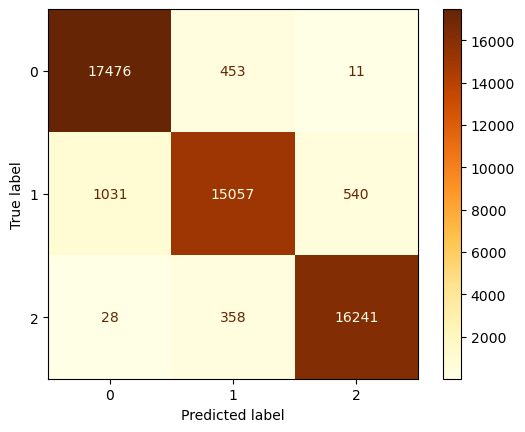

In [59]:
# Display confution metrix
ConfusionMatrixDisplay.from_estimator(Best_rf_model , X_test, y_test, cmap = 'YlOrBr')

# looking at classificatio report
print(classification_report(y_test, y_pred_rf))

<div class="alert alert-info">

### Interpreting the model
    
Let’s again use  __medium strength class(1)__. to interpret our final Random Forest model.
- __Precision__: Out of all the passwords that the model predicted to be medium in strength, only 95% were truly medium in strength.
- __Recall__: Out of all the passwords that were truly medium in strength, the model only predicted 91% correctly as medium in strength.
- __F1 Score__ is 0.93, which closer to 1 and therefor a good predictor.


---
# 6. Evaluating Best model - Random Forest

The ROC curve is an evaluation metric in `sklearn` library forclassification problems that plots the true positive rate against the false positive rate at various threshold values. The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes. The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.

Let’s plot the ROC curves for each class.

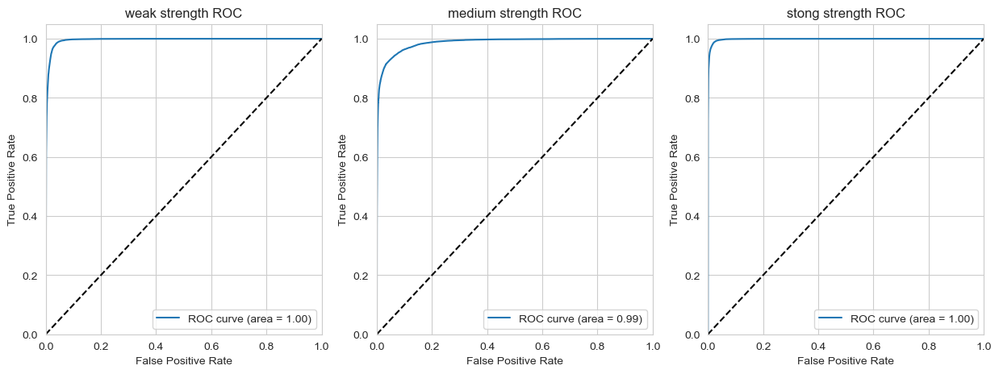

In [98]:
# Binarizing the y_ytest
y_test_lab = label_binarize(y_test, classes=[0,1,2])
n_classes = 3
label_dic = { 0 : "weak", 1: "medium", 2 : "stong"}

y_score = Best_rf_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_lab[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    


# Set up grid of subplots
gridspec.GridSpec(1,3)

# create a figure
fig = plt.figure()

# set size of subplot's
fig.set_figheight(5)
fig.set_figwidth(15)

sns.set_style('whitegrid') # set grid style

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.subplot2grid((1,3), (0,i))
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{label_dic[i]} strength ROC')
    plt.legend(loc="lower right")

plt.show()

The best model will never make a misclassification, so it will always have a true positive rate of 1.0 and a false positive rate of 0. This means that its ROC curve is a flat horizontal line at 1, and the area under this curve is 1.

From the above graph, we have near-perfect AUC (area = 1) for all three classes. Therefore, our model is doing extremely well in distinguishing between positive and negative classes.


---


# 7. Conclusion


We trained two password-strength classifier models using machine learning. Random Forest is capable of classifying password strength across all classes with a high f1-score. This model can now further be deployed and used as a real application. It can be used by social media companies and other web platforms to incorporate as a suggestive feature of password strength when signing up for new accounts. It can be developed as an auto password generator to generate stronger and more secure passwords. The public can also use it to check for various password combinations if deployed as a public web app.

The project can be further improved by adding more observation and retraining on more advanced ML and DL algorithms as well as fine-tuning the hyperparameters.


---